Evaluation
* IoU threshold = 5% (from exploration of results: as gt bboxes are extremly not precise, vast majority of IoU ~5% are TPs)

In [1]:
# import required modules
import os
import pandas as pd
import numpy as np
import random

from sklearn import metrics
import logging
print('ok')

ok


In [4]:
#general variables
path_to_root = '../../..'

cols = ['img_id','gt_bbox','gt_format','pred_bbox','pred_format','confidence','gt_size','iou']


# Get results table
* Inputs: 
    * txt files from inference.py
* Outputs:
    * results\_{set}\_\{model}.csv with for one row per image, and cols: img_id, gt_bbox	gt_format, pred_bbox,	pred_format,	confidence,	gt_size,	iou

## Write results table to csv

In [16]:
#make_results_table v2 - Adpated for several predicted bboxes
def make_results_table (gt_bbox_dir, pred_bbox_dir, outputFile,
                        gt_format='xywh_pix', pred_format='y1x1y2x2_pix'):
    '''
    Creates dataframe from directories and format for ground truth boxes and predicted boxes. 
    Args:
        gt_bbox_dir: directory of ground truth bounding boxes        
        pred_bbox_dir: directory of ground truth bounding boxes
        
        outputFile : filepath to .csv results table to write (results_{set}_{model}.csv)
        
        
        gt_format (Optional): format of ground truth bounding boxes 'y1x1y2x2_pix' or 'xywh_pix'. Default is 'xywh_pix'
        pred_format (Optional): format of ground truth bounding boxes 'y1x1y2x2_pix' or 'xywh_pix' . Default is 'y1x1y2x2_pix'
    Returns:
        dataframe with cols:
        ['img_id','gt_bbox','gt_format','pred_bbox','pred_format','confidence','gt_size','iou']

    '''
    
    print('Loading GT & predicted bboxes...')
    startTime = time.time()
    
    # collect list of filenames
    pred_bbox_fn = [fn[:-4] for fn in os.listdir(pred_bbox_dir)]
    gt_bbox_fn = [fn[:-4] for fn in os.listdir(gt_bbox_dir)]
    
    elapsed = time.time() - startTime
    print("Finished loaded {} GT bboxes and {} predicted bboxes in {}".format(len(gt_bbox_fn),len(pred_bbox_fn),
          humanfriendly.format_timespan(elapsed)))
    
    # create dictionaries of ground_truth bboxes,  predicted bboxes, and confidence
    ground_truth_dict = {}
    for fn in gt_bbox_fn:
        bbox = parse_txt(os.path.join(gt_bbox_dir, fn+'.txt'), gt_format, 'ground_truth')
        ground_truth_dict[fn] = bbox
    predicted_dict = {}
    conf_dict = {}
    for fn in pred_bbox_fn:
        bbox, conf = parse_txt(os.path.join(pred_bbox_dir, fn+'.txt'), pred_format, 'predicted')
        predicted_dict[fn] = bbox
        conf_dict[fn] = conf
    
    # build dataframe of image, ground_truth bboxes, predicted bboxes, and confidence
    print('Creating results table with ...')
    data = {'img_id' : gt_bbox_fn[:-4]}
    detect_df = pd.DataFrame(data, columns=['img_id'])
    
    print('... GT bboxes')
    detect_df['gt_bbox'] = detect_df['img_id'].map(pd.Series(ground_truth_dict))
    detect_df['gt_format'] = gt_format
    
    print('... predicted bboxes')
    detect_df['pred_bbox'] = detect_df['img_id'].map(pd.Series(predicted_dict))
    detect_df['pred_format'] = pred_format
    
    print('... confidence')
    detect_df['confidence'] = detect_df['img_id'].map(pd.Series(conf_dict))
    
    # add ground_truth bbox size to dataframe
    print('... Bbox size')
    detect_df['gt_size'] = detect_df.apply(
        lambda row: None if row.gt_bbox is None else int((row.gt_bbox[2] - row.gt_bbox[0]) * (row.gt_bbox[3] - row.gt_bbox[1])), 
        axis=1
    )

    
    # add IoU - cameratraps to dataframe
    
    """print('... IoU')
    iou_dict = {}
    for fn in predicted_dict:
        if 'not_a_dam' not in fn:
            iou = calc_IoU(ground_truth_dict[fn], predicted_dict[fn], gt_format, pred_format)
            iou_dict[fn] = iou
        else:
            iou_dict[fn] = None
    detect_df['iou'] = detect_df['img_id'].map(pd.Series(iou_dict))"""
    
    print('... Done \n')

    
    
    # set index to img_id
    detect_df = detect_df.set_index('img_id')
    
    print('Writing CSV ...')
    detect_df.to_csv(outputFile)
    print('... Done')
    
    return detect_df


In [17]:
path_to_root = '../../..'

GT_bbox_Dir = os.path.join(path_to_root, 'data/inputs_imagery-7-25_cropped_419/validation_set/labels/')
Pred_bbox_Dir = os.path.join(path_to_root, 'results/validation_inference_fasterRCNN_07_27_5bb')
gt_format = 'xywh_pix'
pred_format = 'y1x1y2x2_pix'

outputFile = os.path.join(path_to_root, 'results/results_validation_fasterRCNN-07-27_5bboxes.csv')

detect_df = make_results_table(GT_bbox_Dir, Pred_bbox_Dir, outputFile, gt_format, pred_format)


Loading GT & predicted bboxes...
Finished loaded 6564 GT bboxes and 6394 predicted bboxes in 0.01 seconds
Creating results table with ...
... GT bboxes
... predicted bboxes
... confidence
... Bbox size
... Done 

Writing CSV ...
... Done


In [19]:
detect_df.sort_values('img_id')

,gt_bbox,gt_format,pred_bbox,pred_format,confidence,gt_size
img_id,,,,,,
1000-1295_not_a_dam,None,xywh_pix,"[200, 137, 184, 150]",y1x1y2x2_pix,0.1211,NaN
100007,"[262, 280, 351, 333]",xywh_pix,"[326, 261, 282, 348]",y1x1y2x2_pix,0.9114,4717.0
100014,"[249, 281, 343, 311]",xywh_pix,"[300, 262, 291, 286]",y1x1y2x2_pix,0.0602,2820.0
100022,"[73, 89, 149, 134]",xywh_pix,"[109, 58, 79, 145]",y1x1y2x2_pix,0.7623,3420.0
100027,"[105, 100, 138, 143]",xywh_pix,"[145, 99, 101, 137]",y1x1y2x2_pix,0.6955,1419.0
100032,"[14, 78, 194, 130]",xywh_pix,"[127, 10, 82, 197]",y1x1y2x2_pix,0.9116,9360.0
100040,"[275, 313, 420, 381]",xywh_pix,"[356, 276, 308, 364]",y1x1y2x2_pix,0.7044,9860.0
100041,"[250, 242, 264, 273]",xywh_pix,"[275, 248, 238, 265]",y1x1y2x2_pix,0.6317,434.0
100048,"[208, 242, 352, 319]",xywh_pix,"[322, 206, 239, 359]",y1x1y2x2_pix,0.8819,11088.0


## Load an existing results table

In [2]:
# Load csv
path_to_root = '../../..'
path_to_rez_table = os.path.join(path_to_root, 'results/_max_bbox_per_img_1/results_validation_fasterRCNN-08-26.csv')
results_df = pd.read_csv(path_to_rez_table)

results_df_vsmall = results_df[results_df['gt_size']<500]
results_df_smalldams = results_df[(results_df['gt_size']>=500) & (results_df['gt_size']<=1800)]
results_df_vbig = results_df[results_df['gt_size']>1800]

results_df_smallpreds = results_df[(results_df['pred_size']>=500) & (results_df['pred_size']<=1800)]


results_table_name = 'results_validation_fasterRCNN-08-26.csv'

In [38]:
# Load csv
path_to_root = '../../..'
path_to_rez_table = os.path.join(path_to_root, 'results/_max_bbox_per_img_1/results_validationhalfhalf_fasterRCNN-08-26.csv')
results_df = pd.read_csv(path_to_rez_table)

results_df_vsmall = results_df[results_df['gt_size']<500]
results_df_smalldams = results_df[(results_df['gt_size']>=500) & (results_df['gt_size']<=1800)]
results_df_vbig = results_df[results_df['gt_size']>1800]

results_df_smallpreds = results_df[(results_df['pred_size']>=500) & (results_df['pred_size']<=1800)]


results_table_name = 'results_validationhalfhalf_fasterRCNN-08-26'

In [36]:
# Load csv
path_to_root = '../../..'
path_to_rez_table = os.path.join(path_to_root, 'results/_max_bbox_per_img_1/results_validationhalfhalf_fasterRCNN-07-27.csv')
results_df = pd.read_csv(path_to_rez_table)

results_df_vsmall = results_df[results_df['gt_size']<500]
results_df_smalldams = results_df[(results_df['gt_size']>=500) & (results_df['gt_size']<=1800)]
results_df_vbig = results_df[results_df['gt_size']>1800]

results_df_smallpreds = results_df[(results_df['pred_size']>=500) & (results_df['pred_size']<=1800)]


results_table_name = 'results_validationhalfhalf_fasterRCNN-07-27'

In [55]:
# Load csv
path_to_root = '../../..'
path_to_rez_table = os.path.join(path_to_root, 'results/_max_bbox_per_img_1/results_validation_fasterRCNN-07-27.csv')
results_df = pd.read_csv(path_to_rez_table)

results_df_vsmall = results_df[results_df['gt_size']<500]
results_df_smalldams = results_df[(results_df['gt_size']>=500) & (results_df['gt_size']<=1800)]
results_df_vbig = results_df[results_df['gt_size']>1800]

results_df_smallpreds = results_df[(results_df['pred_size']>=500) & (results_df['pred_size']<=1800)]


results_table_name = 'results_validation_fasterRCNN-07-27'

## Filter by size
Size is based on ground truth bounding box size, in pixel. "Small dams" at size of interest are between 500 to 1800 pixels.

In [16]:
#results_table_name = 'results_validation_fasterRCNN-07-27_.csv'

results_df_vsmall = results_df[results_df['gt_size']<500]
results_df_smalldams = results_df[(results_df['gt_size']>=500) & (results_df['gt_size']<=1800)]
results_df_vbig = results_df[results_df['gt_size']>1800]

In [17]:
##Print dataset stats

num_imgs = len(results_df)
num_dams = np.where(results_df.gt_bbox.notnull(), 1, 0).sum()

print('For this set from ',results_table_name,':')
print(' ')
print('-- ',len(results_df),' images total')
print('--  {} ({:.0f}%) are dams'.format(num_dams,num_dams/num_imgs*100))

print('    of which --  {:.1f}% are "Small dams" (size of interest 500-1800)'.format(len(results_df_smalldams)/num_dams*100))
print('             --  {:.1f}%% are smaller'.format(len(results_df_vsmall)/num_dams*100))
print('             --  {:.1f}%% are bigger'.format(len(results_df_vbig)/num_dams*100))

For this set from  results_validation_fasterRCNN-08-26.csv :
 
--  6565  images total
--  5672 (86%) are dams
    of which --  26.1% are "Small dams" (size of interest 500-1800)
             --  27.9%% are smaller
             --  46.0%% are bigger


# Custom evaluation
* Inputs
    * results\_{set}\_{model}.csv
* Outputs
     * Evaluation metrics:
      - For Dams sizes = _Small dams_
      - Recall @ 5% IoU and ≠ min confidence thresholds.

In [3]:
# Evaluation utils
from evaluation_utils import *

## Print % of TP, FP, TN, FN

### Results

In [108]:
## Print Details results (Categories)
print(results_table_name)

print('For all dams sizes: \n')
for iou_thres in [0.05,0.1,0.3]:
    for conf_thres in [0.1,0.2,0.3,0.4,0.5,0.7]:
        print_categories_pct(results_df, iou_thres, conf_thres)
        
print('--- \n For Small dams (500-1800): \n')
for iou_thres in [0.05,0.1,0.3]:
    for conf_thres in [0.1,0.2,0.3,0.4,0.5,0.7]:
        print_categories_pct(results_df_smalldams, iou_thres, conf_thres)


results_validation_fasterRCNN-08-26.csv
For all dams sizes: 

with IoU threshold = 0.05
with min. Confidence = 0.1
TP: 61%,  FP: 4.8%, FP+FN: 20%, FN: 5%, TN: 9%

with IoU threshold = 0.05
with min. Confidence = 0.2
TP: 57%,  FP: 2.2%, FP+FN: 12%, FN: 18%, TN: 11%

with IoU threshold = 0.05
with min. Confidence = 0.3
TP: 53%,  FP: 1.5%, FP+FN: 9%, FN: 24%, TN: 12%

with IoU threshold = 0.05
with min. Confidence = 0.4
TP: 49%,  FP: 1.0%, FP+FN: 6%, FN: 31%, TN: 13%

with IoU threshold = 0.05
with min. Confidence = 0.5
TP: 45%,  FP: 0.7%, FP+FN: 5%, FN: 37%, TN: 13%

with IoU threshold = 0.05
with min. Confidence = 0.7
TP: 32%,  FP: 0.3%, FP+FN: 2%, FN: 52%, TN: 13%

with IoU threshold = 0.1
with min. Confidence = 0.1
TP: 59%,  FP: 4.8%, FP+FN: 22%, FN: 5%, TN: 9%

with IoU threshold = 0.1
with min. Confidence = 0.2
TP: 56%,  FP: 2.2%, FP+FN: 13%, FN: 18%, TN: 11%

with IoU threshold = 0.1
with min. Confidence = 0.3
TP: 52%,  FP: 1.5%, FP+FN: 10%, FN: 24%, TN: 12%

with IoU threshold = 0

/Users/charlotteweil1/.local/lib/python3.6/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/Users/charlotteweil1/.local/lib/python3.6/site-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/Users/charlotteweil1/.local/lib/python3.6/site-packages/ipykernel_launcher.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

Se

TP: 67%,  FP: 0.0%, FP+FN: 18%, FN: 16%, TN: 0%

with IoU threshold = 0.05
with min. Confidence = 0.3
TP: 60%,  FP: 0.0%, FP+FN: 14%, FN: 26%, TN: 0%

with IoU threshold = 0.05
with min. Confidence = 0.4
TP: 54%,  FP: 0.0%, FP+FN: 11%, FN: 35%, TN: 0%

with IoU threshold = 0.05
with min. Confidence = 0.5
TP: 46%,  FP: 0.0%, FP+FN: 9%, FN: 45%, TN: 0%

with IoU threshold = 0.05
with min. Confidence = 0.7
TP: 28%,  FP: 0.0%, FP+FN: 5%, FN: 67%, TN: 0%

with IoU threshold = 0.1
with min. Confidence = 0.1
TP: 70%,  FP: 0.0%, FP+FN: 26%, FN: 4%, TN: 0%

with IoU threshold = 0.1
with min. Confidence = 0.2
TP: 65%,  FP: 0.0%, FP+FN: 19%, FN: 16%, TN: 0%

with IoU threshold = 0.1
with min. Confidence = 0.3
TP: 59%,  FP: 0.0%, FP+FN: 15%, FN: 26%, TN: 0%

with IoU threshold = 0.1
with min. Confidence = 0.4
TP: 53%,  FP: 0.0%, FP+FN: 12%, FN: 35%, TN: 0%

with IoU threshold = 0.1
with min. Confidence = 0.5
TP: 45%,  FP: 0.0%, FP+FN: 10%, FN: 45%, TN: 0%

with IoU threshold = 0.1
with min. Confid

In [110]:
## Print Details results (Categories)
print(results_table_name)

print('For all dams sizes: \n')
for iou_thres in [0.05,0.1,0.3]:
    for conf_thres in [0.1,0.2,0.3,0.4,0.5,0.7]:
        print_categories_pct(results_df, iou_thres, conf_thres)
        
print('--- \n For Small dams (500-1800): \n')
for iou_thres in [0.05,0.1,0.3]:
    for conf_thres in [0.1,0.2,0.3,0.4,0.5,0.7]:
        print_categories_pct(results_df_smalldams, iou_thres, conf_thres)


results_validationhalfhalf_fasterRCNN-08-26
For all dams sizes: 

with IoU threshold = 0.05
with min. Confidence = 0.1
TP: 33%,  FP: 17.6%, FP+FN: 11%, FN: 3%, TN: 36%

with IoU threshold = 0.05
with min. Confidence = 0.2
TP: 30%,  FP: 4.1%, FP+FN: 6%, FN: 9%, TN: 50%

with IoU threshold = 0.05
with min. Confidence = 0.3
TP: 29%,  FP: 2.6%, FP+FN: 5%, FN: 13%, TN: 51%

with IoU threshold = 0.05
with min. Confidence = 0.4
TP: 26%,  FP: 1.7%, FP+FN: 3%, FN: 17%, TN: 52%

with IoU threshold = 0.05
with min. Confidence = 0.5
TP: 24%,  FP: 1.2%, FP+FN: 3%, FN: 20%, TN: 52%

with IoU threshold = 0.05
with min. Confidence = 0.7
TP: 17%,  FP: 0.4%, FP+FN: 1%, FN: 28%, TN: 53%

with IoU threshold = 0.1
with min. Confidence = 0.1
TP: 32%,  FP: 17.6%, FP+FN: 12%, FN: 3%, TN: 36%

with IoU threshold = 0.1
with min. Confidence = 0.2
TP: 30%,  FP: 4.1%, FP+FN: 7%, FN: 9%, TN: 50%

with IoU threshold = 0.1
with min. Confidence = 0.3
TP: 28%,  FP: 2.6%, FP+FN: 5%, FN: 13%, TN: 51%

with IoU threshold 

/Users/charlotteweil1/.local/lib/python3.6/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/Users/charlotteweil1/.local/lib/python3.6/site-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/Users/charlotteweil1/.local/lib/python3.6/site-packages/ipykernel_launcher.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

Se

TP: 67%,  FP: 0.0%, FP+FN: 18%, FN: 16%, TN: 0%

with IoU threshold = 0.05
with min. Confidence = 0.3
TP: 60%,  FP: 0.0%, FP+FN: 14%, FN: 26%, TN: 0%

with IoU threshold = 0.05
with min. Confidence = 0.4
TP: 54%,  FP: 0.0%, FP+FN: 11%, FN: 35%, TN: 0%

with IoU threshold = 0.05
with min. Confidence = 0.5
TP: 46%,  FP: 0.0%, FP+FN: 9%, FN: 45%, TN: 0%

with IoU threshold = 0.05
with min. Confidence = 0.7
TP: 28%,  FP: 0.0%, FP+FN: 5%, FN: 67%, TN: 0%

with IoU threshold = 0.1
with min. Confidence = 0.1
TP: 70%,  FP: 0.0%, FP+FN: 26%, FN: 4%, TN: 0%

with IoU threshold = 0.1
with min. Confidence = 0.2
TP: 65%,  FP: 0.0%, FP+FN: 19%, FN: 16%, TN: 0%

with IoU threshold = 0.1
with min. Confidence = 0.3
TP: 59%,  FP: 0.0%, FP+FN: 15%, FN: 26%, TN: 0%

with IoU threshold = 0.1
with min. Confidence = 0.4
TP: 53%,  FP: 0.0%, FP+FN: 12%, FN: 35%, TN: 0%

with IoU threshold = 0.1
with min. Confidence = 0.5
TP: 45%,  FP: 0.0%, FP+FN: 10%, FN: 45%, TN: 0%

with IoU threshold = 0.1
with min. Confid

In [16]:
for iou in [0, 0.05, 0.2]:
    for conf in [0.08, 0.1, 0.3,0.5,0.7,0.9]:
        r = get_recall_score(results_df, iou, conf)
        print('IoU {}, Confidence {} --> Recall: {:.2f}'.format(iou, conf, r))

IoU 0, Confidence 0.3 --> Recall: 0.63
IoU 0, Confidence 0.5 --> Recall: 0.52
IoU 0, Confidence 0.7 --> Recall: 0.38
IoU 0, Confidence 0.9 --> Recall: 0.13
IoU 0.05, Confidence 0.3 --> Recall: 0.62
IoU 0.05, Confidence 0.5 --> Recall: 0.52
IoU 0.05, Confidence 0.7 --> Recall: 0.38
IoU 0.05, Confidence 0.9 --> Recall: 0.13
IoU 0.2, Confidence 0.3 --> Recall: 0.58
IoU 0.2, Confidence 0.5 --> Recall: 0.49
IoU 0.2, Confidence 0.7 --> Recall: 0.36
IoU 0.2, Confidence 0.9 --> Recall: 0.13


In [111]:
print_categories_pct(results_df, 0.05, 0.1,pct=False)
print_categories_pct(results_df, 0.05, 0.08,pct=False)

with IoU threshold = 0.05
with min. Confidence = 0.1
Cat@IoU0.05@conf0.1
Error       8
FN        354
FP       2157
FP+FN    1315
TN       4402
TP       4001
Name: img_id, dtype: int64 

with IoU threshold = 0.05
with min. Confidence = 0.08
Cat@IoU0.05@conf0.08
Error      11
FN        103
FP       4374
FP+FN    1541
TN       2181
TP       4027
Name: img_id, dtype: int64 



## Precision & recall

In [54]:
print(results_table_name,'\n')

get_precision_score(results_df,0.05,0.08)

results_validation_fasterRCNN-08-26.csv 



0.6582216410591697

In [4]:
print(results_table_name,'\n')
iou_thres = 0.05

for conf_thres in [0.1,0.2,0.25,0.3,0.5]:

    r = get_recall_score(results_df,iou_thres,conf_thres)
    p =get_precision_score(results_df,iou_thres,conf_thres)
    print('with IoU > {:.2f} and confidence > {:.2f}, Recall = {:.2f} and Precision={:.2f}\n'.format(iou_thres,conf_thres,r,p))


results_validation_fasterRCNN-08-26.csv 

df column Cat@IoU0.05@conf0.1 do not exist. Making it...
with IoU > 0.05 and confidence > 0.10, Recall = 0.71 and Precision=0.71

df column Cat@IoU0.05@conf0.2 do not exist. Making it...
with IoU > 0.05 and confidence > 0.20, Recall = 0.66 and Precision=0.80

df column Cat@IoU0.05@conf0.25 do not exist. Making it...
with IoU > 0.05 and confidence > 0.25, Recall = 0.64 and Precision=0.82

df column Cat@IoU0.05@conf0.3 do not exist. Making it...
with IoU > 0.05 and confidence > 0.30, Recall = 0.62 and Precision=0.84

df column Cat@IoU0.05@conf0.5 do not exist. Making it...
with IoU > 0.05 and confidence > 0.50, Recall = 0.52 and Precision=0.89



In [37]:
print(results_table_name,'\n')
iou_thres = 0.05

for conf_thres in [0.1,0.2,0.25,0.3,0.5]:

    r = get_recall_score(results_df,iou_thres,conf_thres)
    p =get_precision_score(results_df,iou_thres,conf_thres)
    print('with IoU > {:.2f} and confidence > {:.2f}, Recall = {:.2f} and Precision={:.2f}\n'.format(iou_thres,conf_thres,r,p))


results_validationhalfhalf_fasterRCNN-07-27 

df column Cat@IoU0.05@conf0.1 do not exist. Making it...
with IoU > 0.05 and confidence > 0.10, Recall = 0.71 and Precision=0.51

df column Cat@IoU0.05@conf0.2 do not exist. Making it...
with IoU > 0.05 and confidence > 0.20, Recall = 0.67 and Precision=0.65

df column Cat@IoU0.05@conf0.25 do not exist. Making it...
with IoU > 0.05 and confidence > 0.25, Recall = 0.65 and Precision=0.69

df column Cat@IoU0.05@conf0.3 do not exist. Making it...
with IoU > 0.05 and confidence > 0.30, Recall = 0.63 and Precision=0.73

df column Cat@IoU0.05@conf0.5 do not exist. Making it...
with IoU > 0.05 and confidence > 0.50, Recall = 0.53 and Precision=0.83



In [57]:
print(results_table_name,'\n')
iou_thres = 0.05

for conf_thres in [0.1,0.2,0.25,0.3,0.5]:

    r = get_recall_score(results_df,iou_thres,conf_thres)
    p =get_precision_score(results_df,iou_thres,conf_thres)
    print('with IoU > {:.2f} and confidence > {:.2f}, Recall = {:.2f} and Precision={:.2f}\n'.format(iou_thres,conf_thres,r,p))


results_validation_fasterRCNN-07-27 

with IoU > 0.05 and confidence > 0.10, Recall = 0.71 and Precision=0.71

with IoU > 0.05 and confidence > 0.20, Recall = 0.67 and Precision=0.79

with IoU > 0.05 and confidence > 0.25, Recall = 0.65 and Precision=0.82

with IoU > 0.05 and confidence > 0.30, Recall = 0.63 and Precision=0.84

with IoU > 0.05 and confidence > 0.50, Recall = 0.53 and Precision=0.89



In [198]:
print(results_table_name,'\n')
iou_thres = 0.05

for conf_thres in [0.1,0.2,0.25,0.3,0.5]:

    r = get_recall_score(results_df,iou_thres,conf_thres)
    p =get_precision_score(results_df,iou_thres,conf_thres)
    print('with IoU > {:.2f} and confidence > {:.2f}, Recall = {:.2f} and Precision={:.2f}\n'.format(iou_thres,conf_thres,r,p))


results_validation_fasterRCNN-08-26.csv 

with IoU > 0.05 and confidence > 0.10, Recall = 0.71 and Precision=0.71

with IoU > 0.05 and confidence > 0.20, Recall = 0.66 and Precision=0.80

with IoU > 0.05 and confidence > 0.25, Recall = 0.64 and Precision=0.82

with IoU > 0.05 and confidence > 0.30, Recall = 0.62 and Precision=0.84

with IoU > 0.05 and confidence > 0.50, Recall = 0.52 and Precision=0.89



## Precison/recall by confidence and IoU analysis

In [39]:
import matplotlib.pyplot as plt

In [42]:
results_table_name

'results_validationhalfhalf_fasterRCNN-08-26'

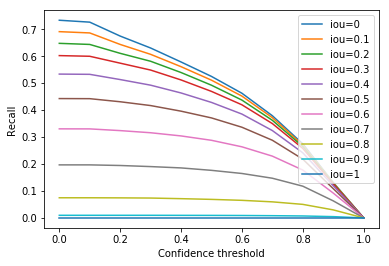

In [43]:
thresholds = [0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1]

for iou in thresholds:
    recalls = [get_recall_score(results_df, iou, conf) for conf in thresholds]
    label = 'iou='+str(iou)
    plt.plot(thresholds,recalls,label=label);
plt.xlabel("Confidence threshold");
plt.ylabel("Recall");
plt.legend();

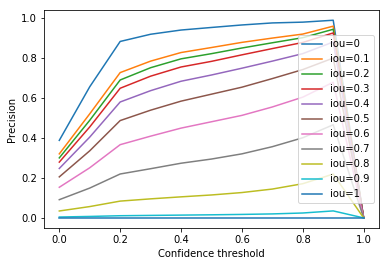

In [44]:
thresholds = [0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1]

for iou in thresholds:
    precisions = [get_precision_score(results_df, iou, conf) for conf in thresholds]
    label = 'iou='+str(iou)
    plt.plot(thresholds,precisions,label=label);
plt.xlabel("Confidence threshold");
plt.ylabel("Precision");
plt.legend();

results_validationhalfhalf_fasterRCNN-08-26
df column Cat@IoU0@conf0 do not exist. Making it...
df column Cat@IoU0@conf0.1 do not exist. Making it...
df column Cat@IoU0@conf0.2 do not exist. Making it...
df column Cat@IoU0@conf0.3 do not exist. Making it...
df column Cat@IoU0@conf0.4 do not exist. Making it...
df column Cat@IoU0@conf0.5 do not exist. Making it...
df column Cat@IoU0@conf0.6 do not exist. Making it...
df column Cat@IoU0@conf0.7 do not exist. Making it...
df column Cat@IoU0@conf0.8 do not exist. Making it...
df column Cat@IoU0@conf0.9 do not exist. Making it...
df column Cat@IoU0@conf1 do not exist. Making it...
df column Cat@IoU0.1@conf0 do not exist. Making it...
df column Cat@IoU0.1@conf0.1 do not exist. Making it...
df column Cat@IoU0.1@conf0.2 do not exist. Making it...
df column Cat@IoU0.1@conf0.3 do not exist. Making it...
df column Cat@IoU0.1@conf0.4 do not exist. Making it...
df column Cat@IoU0.1@conf0.5 do not exist. Making it...
df column Cat@IoU0.1@conf0.6 do 

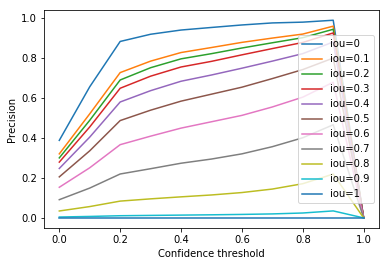

In [180]:
print(results_table_name)

thresholds = [0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1]

for iou in thresholds:
    precisions = [get_precision_score(results_df, iou, conf) for conf in thresholds]
    label = 'iou='+str(iou)
    plt.plot(thresholds,precisions,label=label);
plt.xlabel("Confidence threshold");
plt.ylabel("Precision");
plt.legend();

### (Failed) Attempt to plot Precision/Recall curve.
But y_scores doesn't work in OD with all cases :/
(conf_thres shoudln't affect)

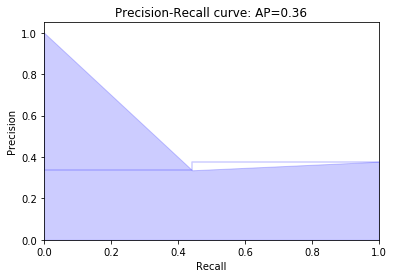

In [47]:
iou_thres = 0.5
conf_thres = 0.1

df_raw = results_df

Category = 'Cat@IoU'+str(iou_thres)+'@conf'+str(conf_thres)

try:
    df_raw[Category]
except KeyError:
    print('df column ' + Category + ' do not exist. Making it...')
    df_raw = add_result_col(df_raw, iou_thres, conf_thres)

#if not 'FP+FN' in df_raw[Category].unique():
#    raise Exception("The input dataframe must contain a row per image, not a row per observation (thus the raw results df with 'FP+FN'")

df = make_results_df_per_obs(df_raw,iou_thres,conf_thres)

y_true = np.where(df['gt_bbox'].notnull(), 1, 0)
y_scores = ### ?
#y_pred= np.where(df[Category]=='FP', 1,(np.where(df[Category]=='TP',1,0)))
# Should be y_scores, y_pred is binary.

precision, recall, thresholds = metrics.precision_recall_curve(y_true, y_scores)
average_precision = metrics.average_precision_score(y_true, y_scores)

plt.step(recall, precision, color='b', alpha=0.2,
         where='post')
plt.fill_between(recall, precision, alpha=0.2, color='b')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.title('Precision-Recall curve: AP={0:0.2f}'.format(
          average_precision));

In [48]:
for p,r,t in zip(precision,recall,thresholds):
    print(p,r,t)

0.3770775162877277 1.0 0
0.33583188328202385 0.44234837799717913 1


# Visualize

In [1]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from shapely.geometry import box

from viz_utils import *

## SEVERAL BBOXES -- Work in progress

### New adapted utils

In [10]:
def visualize_bbox2(images_filenames, images_dir, df,
                   max_images=100,BIG_IMAGES=False,save_dir=False):

    '''if .txt file in the same directory'''
    fig = plt.figure(figsize=(12,240))

    k=0
    for img_fn in images_filenames:
        k+=1
        
        #  Image
        img_fp = os.path.join(images_dir, img_fn)
        try:
            img = mpimg.imread(img_fp)
        except FileNotFoundError:
            print("File Not Found: ",img_fp)
        else:
            s = img.shape; imageHeight = s[0]; imageWidth = s[1]
            logging.debug(img_fn)
            
            # Plot
            ax = fig.add_subplot(20,1,k)
            ax.imshow(img)
            
            for index, row in df[df['img_id']==fn].iterrows():
                coords = row.pred_bbox
                    
                # BBox format
                bbox = box(coords[0], coords[1], coords[2], coords[3])
                x,y = bbox.exterior.xy

                try: # If there are bboxes
                    ax.plot(x,y,color='lightblue',linewidth=4)
                except NameError:
                    pass
                
                ## Important ! Delete variables, so bboxes don't get plotted on next image !!
                x,y=0,0

            # This is magic goop that removes whitespace around image plots (sort of)        
            ax.xaxis.set_major_locator(ticker.NullLocator())
            ax.yaxis.set_major_locator(ticker.NullLocator())
            if BIG_IMAGES == True:
                plt.subplots_adjust(top = 1, bottom = 0, right = 1, left = 0, hspace = 0, 
                                wspace = 0)
                plt.margins(0,0)
                ax.xaxis.set_major_locator(ticker.NullLocator())
                ax.yaxis.set_major_locator(ticker.NullLocator())
                ax.axis('tight')
                ax.set(xlim=[0,imageWidth],ylim=[imageHeight,0],aspect=1)
                plt.axis('off') 

            if save_dir !=False:
                #Save only subplot corresponding to img_fn
                extent = ax.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
                fig.savefig(os.path.join(save_dir,img_fn[:-4]+'_'+BOXES+'.png'),
                            bbox_inches=extent,dpi=150)

In [ ]:
# New parse_txt fct with several lines

def parse_line (line,format_bbox,gt_or_pred):
    if format_bbox == 'y1x1y2x2_norm':
        if len(line) == 0:
            return None
        else:
            vals = line.split(' ')
            x_min = int(float(vals[1]) * 419)
            y_min = int(float(vals[2]) * 419)
            x_max = int(float(vals[3]) * 419)
            y_max = int(float(vals[0]) * 419)
            coords = np.array([y_min, x_min, y_max, x_max])
            if gt_or_pred == 'ground_truth':
                return coords
            elif gt_or_pred == 'predicted':
                conf = float(vals[5])
                conf = '%.4f'%(conf)
                return coords, conf
    elif format_bbox == 'y1x1y2x2_pix':
        if len(line) == 0:
            return None
        else:
            vals = line.split(' ')
            x_min = int(float(vals[1]))
            y_min = int(float(vals[2]))
            x_max = int(float(vals[3]))
            y_max = int(float(vals[0]))
            coords = np.array([y_min, x_min, y_max, x_max])
            if gt_or_pred == 'ground_truth':
                return coords
            elif gt_or_pred == 'predicted':
                conf = float(vals[5])
                conf = '%.4f'%(conf)
                return coords, conf
    elif format_bbox == 'xywh_pix':
        if len(line) == 0:
            return None
        else:
            vals = line.split(' ')
            norm_x = float(vals[1])
            norm_y = float(vals[2])
            norm_w = float(vals[3])
            norm_h = float(vals[4])
            x_min = int((norm_x * 419) - ((norm_w * 419) / 2))
            y_min = int((norm_y * 419) - ((norm_h * 419) / 2))
            x_max = int((norm_x * 419) + ((norm_w * 419) / 2))
            y_max = int((norm_y * 419) + ((norm_h * 419) / 2))
            coords = np.array([x_min, y_min, x_max, y_max])
            if gt_or_pred == 'ground_truth':
                return coords
            elif gt_or_pred == 'predicted':
                conf = float(vals[5])
                conf = '%.4f'%(conf)
                return coords, conf

def parse_txt(filepath,format_bbox,gt_or_pred):
    df = pd.DataFrame()

    with open(filepath) as fp:
        line = fp.readline()
        line_cnt = 1
        if gt_or_pred == 'predicted':
            while line:
                pred_bbox, conf = parse_line (line,format_bbox,'predicted')
                df = df.append({'img_id':fn, 'box_num':int(line_cnt), 'pred_bbox':pred_bbox,'confidence':conf},
                           ignore_index=True)
                line = fp.readline()
                line_cnt += 1
        elif gt_or_pred == 'ground_truth':
            while line:
                pred_bbox, conf = parse_line (line,format_bbox,'ground_truth')

               # MERGE df with ground truth !!
                #= df.append({'img_id':fn, 'box_num':int(line_cnt), 'pred_bbox':pred_bbox,'confidence':conf},
                #           ignore_index=True)
                line = fp.readline()
                line_cnt += 1
    return df


In [31]:
# OLD
def parse_txt (label_fp, format_bbox, gt_or_pred):
    """Obtain x_min, y_min, x_max, and y_max of bounding box from txt file
    Args:
        label_fp (str): filepath to bounding box .txt file in detect.py output format
        format_bbox: 'x1y1x2y2' or 'xywh_pix' or 'x1y1x2y2_pix'
        gt_or_pred: 'predicted' or 'ground_truth'
    Returns:
        coords (numpy array)
        conf (float, returned only if dataset == 'predicted')
    """
    
    if format_bbox == 'y1x1y2x2_norm':
        with open(label_fp, 'r') as label:
            line = str(label.readline())
            if len(line) == 0:
                return None
            else:
                vals = line.split(' ')
                x_min = int(float(vals[1]) * 419)
                y_min = int(float(vals[2]) * 419)
                x_max = int(float(vals[3]) * 419)
                y_max = int(float(vals[0]) * 419)
                coords = np.array([y_min, x_min, y_max, x_max])
                if gt_or_pred == 'ground_truth':
                    return coords
                elif gt_or_pred == 'predicted':
                    conf = float(vals[5])
                    conf = '%.4f'%(conf)
                    return coords, conf
    '''elif format_bbox == 'y1x1y2x2_pix':
        with open(label_fp, 'r') as label:
            line = str(label.readline())
            if len(line) == 0:
                return None
            else:
                vals = line.split(' ')
                x_min = int(float(vals[1]))
                y_min = int(float(vals[2]))
                x_max = int(float(vals[3]))
                y_max = int(float(vals[0]))
                coords = np.array([y_min, x_min, y_max, x_max])
                if gt_or_pred == 'ground_truth':
                    return coords
                elif gt_or_pred == 'predicted':
                    conf = float(vals[5])
                    conf = '%.4f'%(conf)
                    return coords, conf
    elif format_bbox == 'xywh_pix':
        with open(label_fp, 'r') as label:
            line = str(label.readline())
            if len(line) == 0:
                return None
            else:
                vals = line.split(' ')
                norm_x = float(vals[1])
                norm_y = float(vals[2])
                norm_w = float(vals[3])
                norm_h = float(vals[4])
                x_min = int((norm_x * 419) - ((norm_w * 419) / 2))
                y_min = int((norm_y * 419) - ((norm_h * 419) / 2))
                x_max = int((norm_x * 419) + ((norm_w * 419) / 2))
                y_max = int((norm_y * 419) + ((norm_h * 419) / 2))
                coords = np.array([x_min, y_min, x_max, y_max])
                if gt_or_pred == 'ground_truth':
                    return coords
                elif gt_or_pred == 'predicted':
                    conf = float(vals[5])
                    conf = '%.4f'%(conf)
                    return coords, conf
                

### Adaptation to several bboxes

In [12]:
# Filepaths
imgDir = os.path.join(path_to_root,'data','inputs_imagery-7-25_cropped_419','validation_set','images')
resultsDir = os.path.join(path_to_root,'results','validation_fasterRCNN_11-22_10bb')


# Initialize results df
df = pd.DataFrame(columns=['img_id', 'box_num','gt_bbox','gt_format',
                           'pred_bbox','pred_format','confidence','iou'])

# Loop over images
for img_fn in ['36.png', '67.png']:
    fn = img_fn[:-4]
    img_fp = os.path.join(imgDir,img_fn)

    # Find & read predicted txt files and add to results_df
    txt_fp = os.path.join(resultsDir,fn+'.txt')
    if not os.path.exists(txt_fp):
        print('Text file does not exist: ',txt_fp)
    else:
        df_new = parse_txt(txt_fp, 'y1x1y2x2_norm', 'predicted')
        df = df.append(df_new,ignore_index=True)

#multiindex = pd.MultiIndex.from_frame(df[['img_id','box_num']])
#df = df.set_index(['img_id','box_num'])

df


# Find corresponding gt bboxes txt files
# Read gt txt files and add to results_df

,box_num,confidence,gt_bbox,gt_format,img_id,iou,pred_bbox,pred_format
0,1.0,0.8055,NaN,NaN,36,NaN,"[370, 316, 311, 368]",NaN
1,2.0,0.2084,NaN,NaN,36,NaN,"[412, 252, 24, 389]",NaN
2,3.0,0.1746,NaN,NaN,36,NaN,"[294, 246, 0, 404]",NaN
3,4.0,0.1553,NaN,NaN,36,NaN,"[377, 296, 298, 379]",NaN
4,5.0,0.1323,NaN,NaN,36,NaN,"[370, 74, 20, 238]",NaN
5,6.0,0.1244,NaN,NaN,36,NaN,"[262, 17, 2, 274]",NaN
6,7.0,0.1233,NaN,NaN,36,NaN,"[389, 172, 3, 402]",NaN
7,8.0,0.1124,NaN,NaN,36,NaN,"[390, 120, 30, 276]",NaN
8,9.0,0.1068,NaN,NaN,36,NaN,"[415, 211, 93, 374]",NaN
9,10.0,0.1004,NaN,NaN,36,NaN,"[400, 77, 39, 368]",NaN


In [88]:
 visualize_bbox2(['36.png'],imgDir, df)

NameError: name 'visualize_bbox2' is not defined

In [94]:
How to merge GT bboxes (one per img_id) with pred-bboxes (severla per img_id)???

df.merge(DF,how='left')

,box_num,confidence,gt_bbox,gt_format,img_id,iou,pred_bbox,pred_format
0,1.0,0.8783,NaN,NaN,36,NaN,"[364, 316, 317, 363]",NaN
1,2.0,0.1421,NaN,NaN,36,NaN,"[385, 307, 289, 375]",NaN
2,3.0,0.1315,NaN,NaN,36,NaN,"[398, 41, 26, 271]",NaN
3,4.0,0.1022,NaN,NaN,36,NaN,"[390, 259, 35, 419]",NaN
4,5.0,0.0962,NaN,NaN,36,NaN,"[414, 124, 57, 380]",NaN
5,6.0,0.0953,NaN,NaN,36,NaN,"[174, 139, 145, 180]",NaN
6,7.0,0.0920,NaN,NaN,36,NaN,"[192, 125, 136, 177]",NaN
7,8.0,0.0896,NaN,NaN,36,NaN,"[311, 107, 125, 216]",NaN
8,9.0,0.0841,NaN,NaN,36,NaN,"[181, 125, 146, 172]",NaN
9,10.0,0.0832,NaN,NaN,36,NaN,"[164, 136, 148, 175]",NaN


## Visualize from results_df

In [20]:
little_ious = results_df[(results_df['iou']<0.1) & (results_df['iou']>0.05)]
little_ious = little_ious.reset_index()
little_ious.head()

,index,Unnamed: 0,Unnamed: 0.1,img_id,gt_bbox,gt_format,pred_bbox,pred_format,confidence,gt_size,iou,pred_size
0,181,181,181,100048,[208 242 352 319],x1y1x1y2_pix,"[313.0, 120.0, 241.0, 224.0]",y2x1y1x1_pix,0.6709,11088.0,0.065138,7488.0
1,200,200,200,97766,[224 224 232 233],x1y1x1y2_pix,"[239.0, 203.0, 215.0, 244.0]",y2x1y1x1_pix,0.6399,72.0,0.073171,984.0
2,378,378,378,113971,[344 342 349 350],x1y1x1y2_pix,"[355.0, 326.0, 329.0, 348.0]",y2x1y1x1_pix,0.3686,40.0,0.055172,572.0
3,384,384,384,96192,[188 182 199 204],x1y1x1y2_pix,"[188.0, 185.0, 165.0, 228.0]",y2x1y1x1_pix,0.4611,242.0,0.056652,989.0
4,512,512,512,96649,[263 282 309 290],x1y1x1y2_pix,"[284.0, 278.0, 268.0, 296.0]",y2x1y1x1_pix,0.1336,368.0,0.058065,288.0


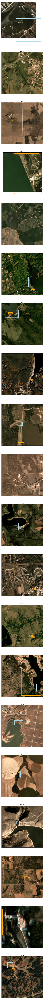

In [23]:
imgDir = os.path.join(path_to_root,'data','inputs_imagery-7-25_cropped_419','validation_set','images')

visualize_bboxes(little_ious[32:52], imgDir)

In [7]:
imgDir = os.path.join(path_to_root,'data','inputs_imagery-7-25_cropped_419','validation_set','images')


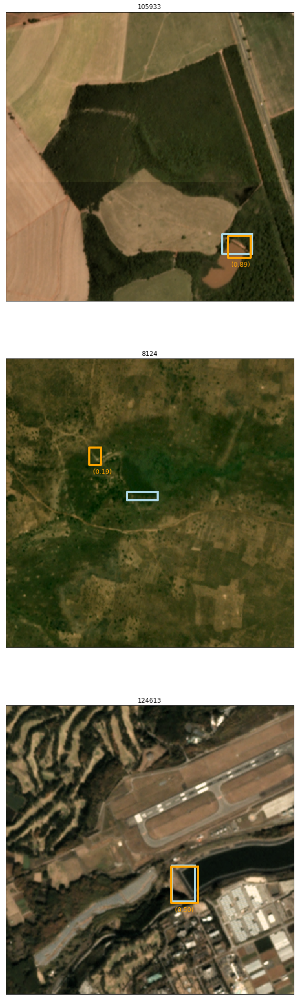

In [8]:
visualize_bboxes(results_df_smalldams.loc[0:10], imgDir)

# Human* baseline performance
\*(Charlie & friends)

### Humans look at:

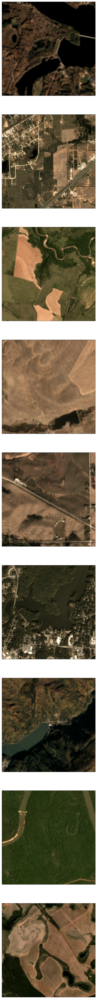

In [231]:
visualize_bboxes(results_df_smalldams.loc[200:250], imgDir,
                 NO_BOXES=True)

### Check against:

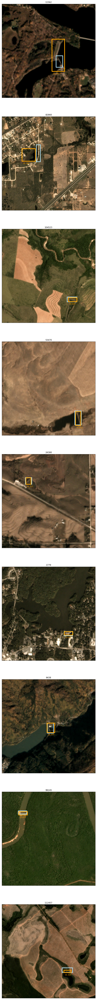

In [230]:
visualize_bboxes(results_df_smalldams.loc[200:250], imgDir)